In [2]:
import openai
from langchain.document_loaders import PyPDFLoader
from langchain.embeddings.openai import OpenAIEmbeddings
from langchain.vectorstores import Chroma
from langchain.chat_models import ChatOpenAI
from langchain.chains import RetrievalQA
from langchain.prompts import PromptTemplate
from langchain.document_loaders import PyPDFLoader
from io import BytesIO



In [3]:
import os
import openai
import sys
import pypdfium2 as pdfium
#Import plt
import matplotlib.pyplot as plt
sys.path.append('../..')

from dotenv import load_dotenv, find_dotenv
_ = load_dotenv(find_dotenv()) # read local .env file

#load api key
openai.api_key  = '...'

In [4]:

import tempfile
import os
from PIL import Image

def convert_pdf_to_images(file_path, scale=300/72):
    
    pdf_file = pdfium.PdfDocument(file_path)
    
    page_indices = [i for i in range(len(pdf_file))]
    
    renderer = pdf_file.render(
        pdfium.PdfBitmap.to_pil,
        page_indices = page_indices, 
        scale = scale,
    )
    
    final_images = [] 
    
    for i, image in zip(page_indices, renderer):
        
        image_byte_array = BytesIO()
        image.save(image_byte_array, format='jpeg', optimize=True)
        image_byte_array = image_byte_array.getvalue()
        final_images.append(dict({i:image_byte_array}))
    
    return final_images


In [5]:
def display_images(list_dict_final_images):
    
    all_images = [list(data.values())[0] for data in list_dict_final_images]
    
    for index, image_bytes in enumerate(all_images):
        
        image = Image.open(BytesIO(image_bytes))
        figure = plt.figure(figsize = (image.width / 100, image.height / 100))
        
        plt.title(f"----- Page Number {index+1} -----")
        plt.imshow(image)
        plt.axis("off")
        plt.show()

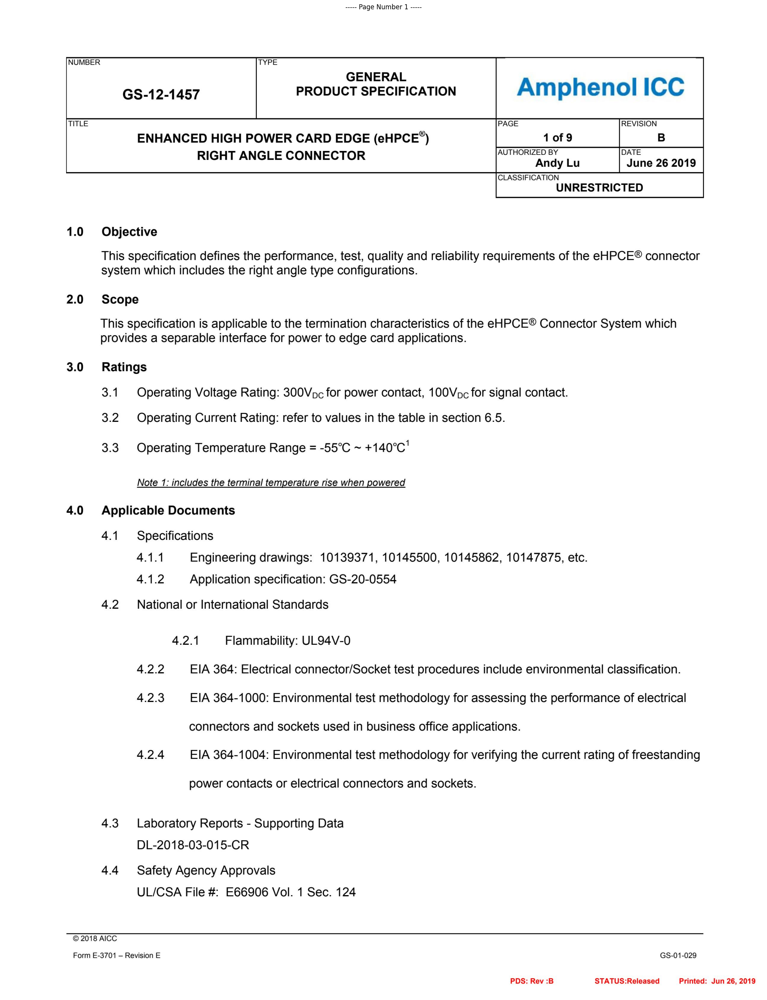

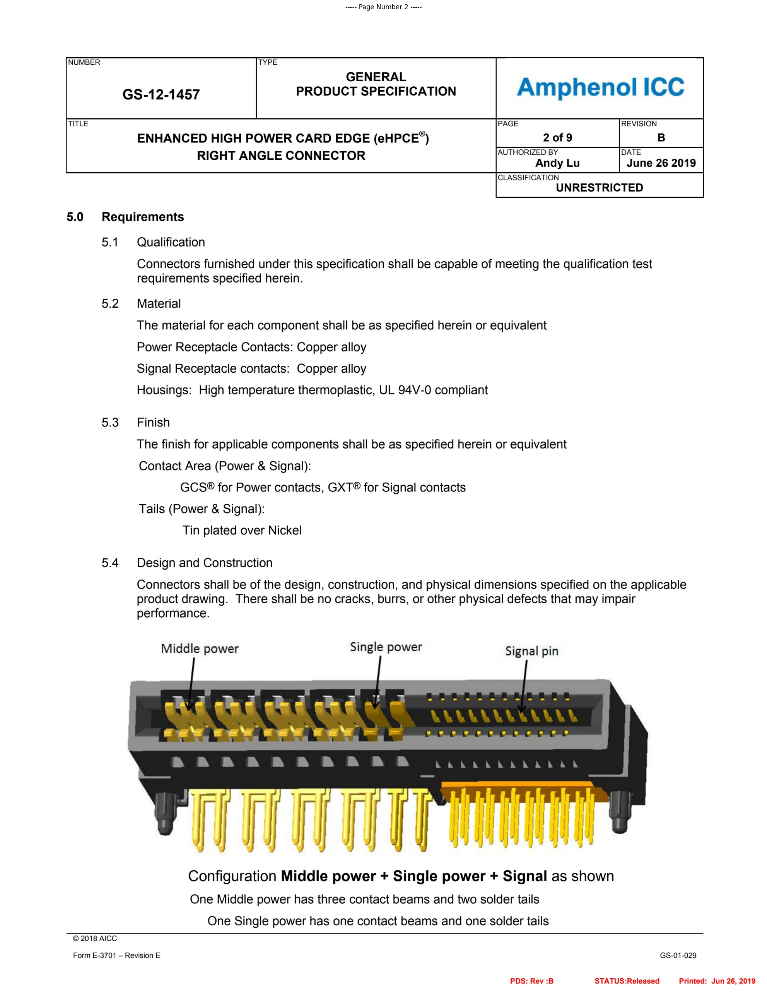

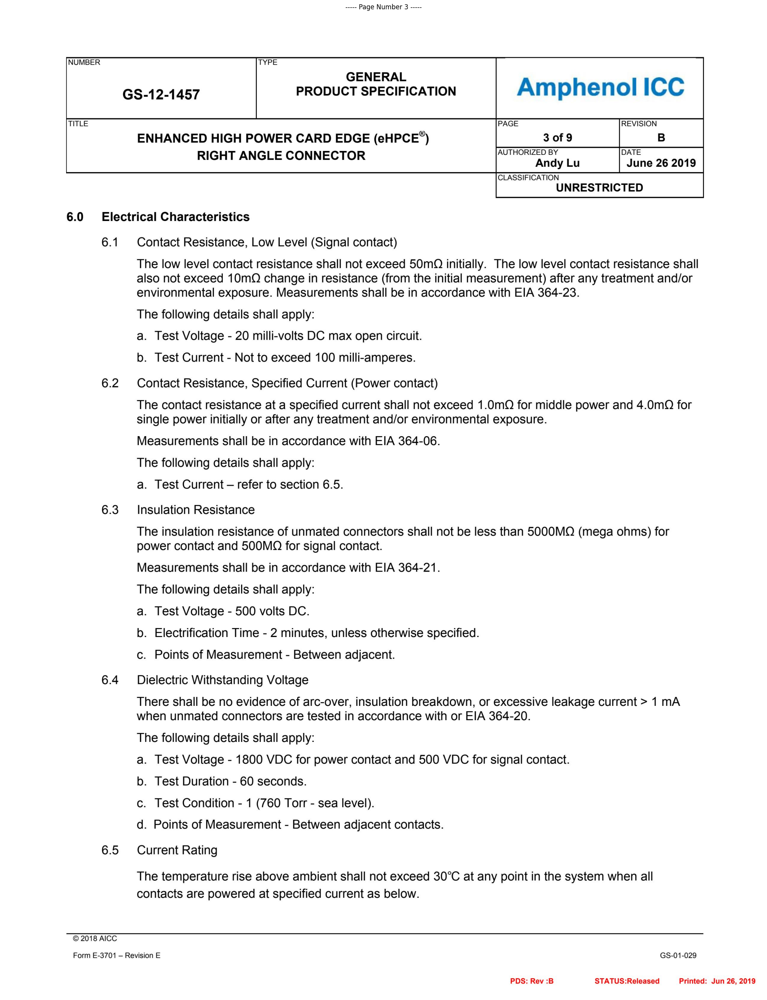

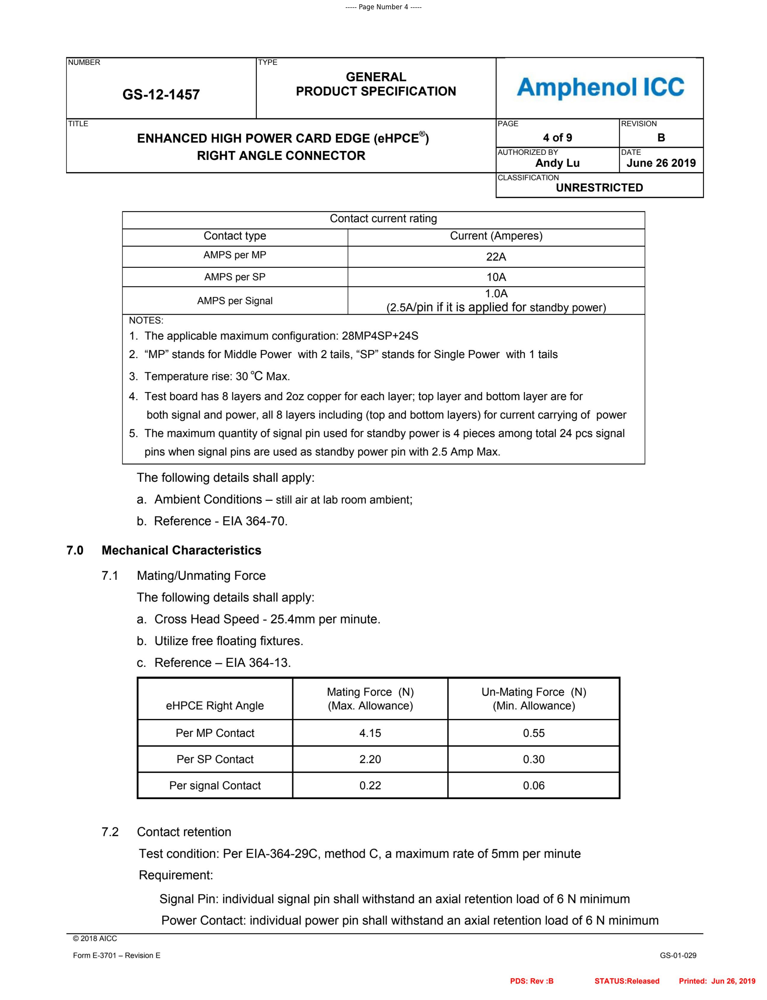

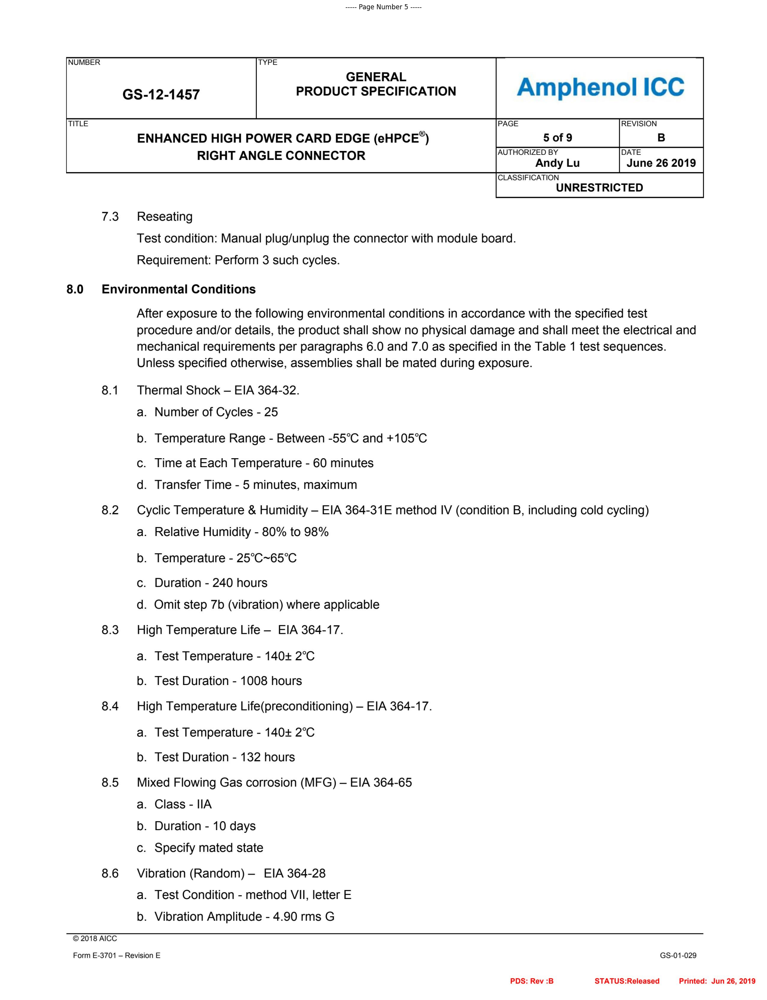

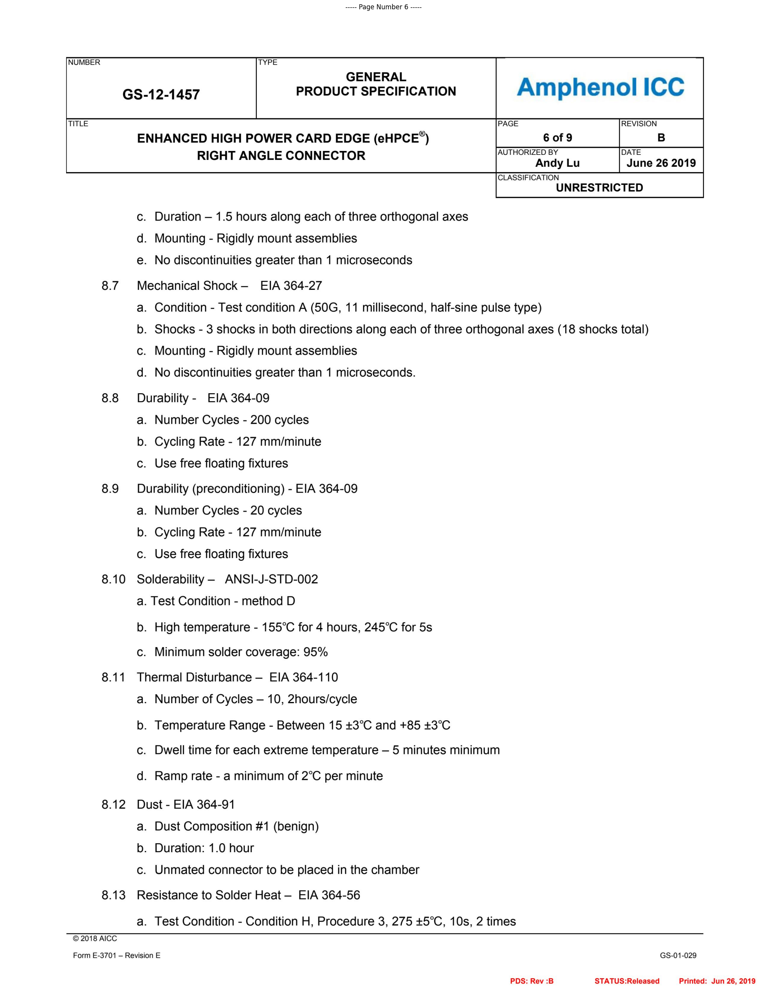

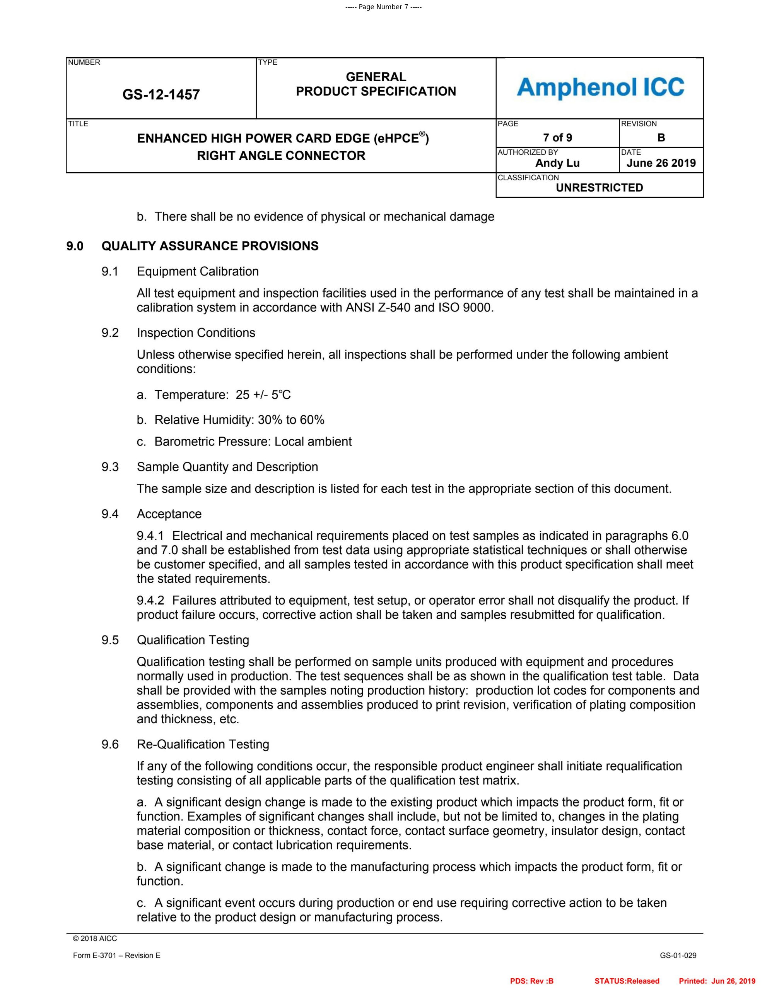

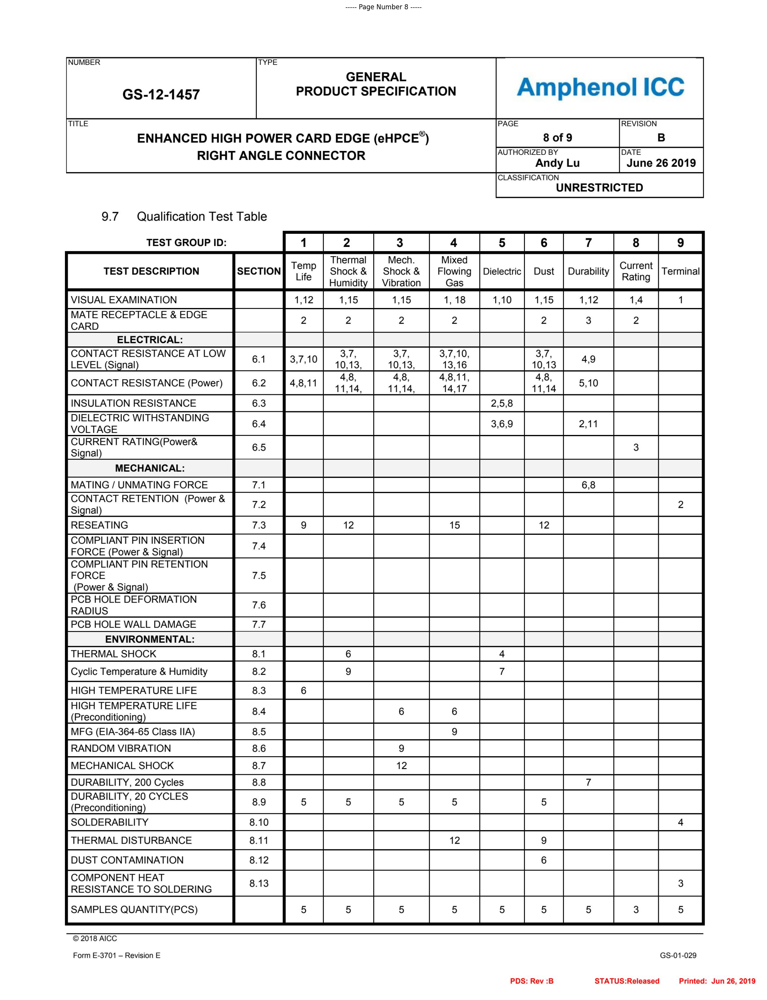

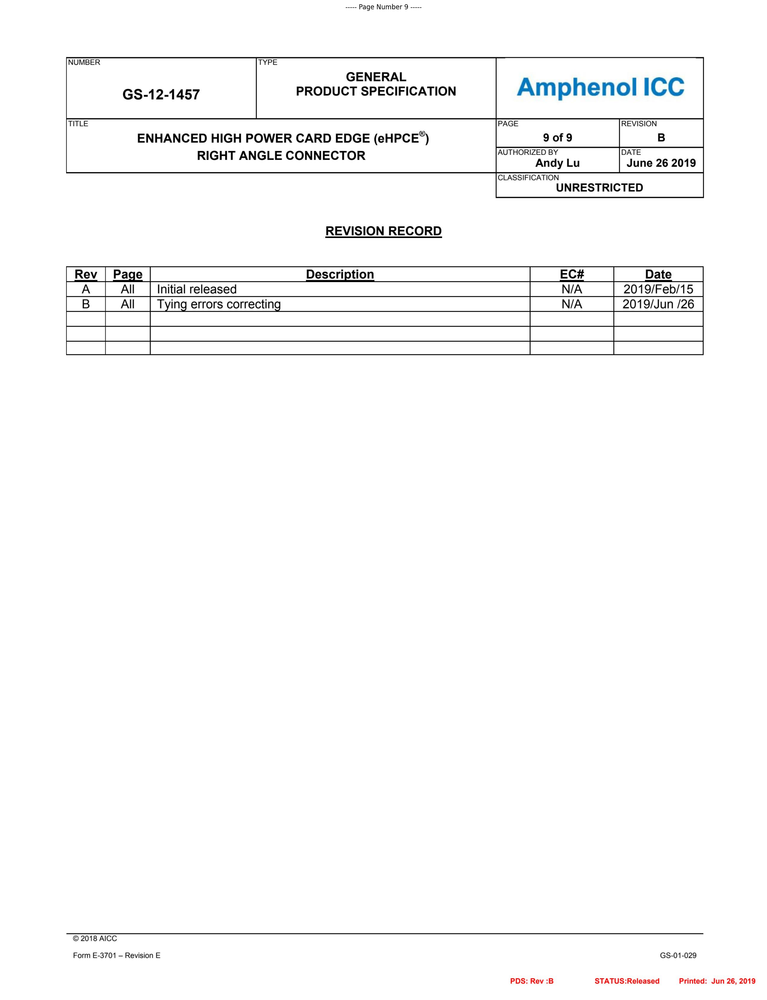

In [6]:
from PIL import Image
pdf_name = "data_folder/gs-12-1457.pdf"
converted_images = convert_pdf_to_images(pdf_name)
display_images(converted_images)


In [7]:
import pytesseract
from pytesseract import image_to_string  

def extract_text_with_pytesseract(list_dict_final_images):
    
    image_list = [list(data.values())[0] for data in list_dict_final_images]
    image_content = []
    
    for index, image_bytes in enumerate(image_list):
        
        image = Image.open(BytesIO(image_bytes))
        raw_text = str(image_to_string(image))
        image_content.append(raw_text)
    
    return "\n".join(image_content) 

In [8]:
text_with_pytesseract = extract_text_with_pytesseract(converted_images)
print(text_with_pytesseract)

NUMBER

GENERAL
GS-12-1457 PRODUCT SPECIFICATION Amphenol ICC

PAGE REVISION
1 of 9 B

AUTHORIZED BY DATE
Andy Lu June 26 2019

CLASSIFICATION
UNRESTRICTED

ENHANCED HIGH POWER CARD EDGE (eHPCE*)
RIGHT ANGLE CONNECTOR

1.0 Objective

This specification defines the performance, test, quality and reliability requirements of the eHPCE® connector
system which includes the right angle type configurations.

2.0 Scope

This specification is applicable to the termination characteristics of the eHPCE® Connector System which
provides a separable interface for power to edge card applications.

3.0 Ratings
3.1 Operating Voltage Rating: 300Vpc for power contact, 100Vpc for signal contact.

3.2 Operating Current Rating: refer to values in the table in section 6.5.

3.3. Operating Temperature Range = -55°C ~ +140°C'

Note 1: includes the terminal temperature rise when powered
4.0 Applicable Documents

4.1 Specifications
4.1.1 Engineering drawings: 10139371, 10145500, 10145862, 10147875, etc.
4.1.2 Ap

In [9]:
class Document:
    def __init__(self, content, metadata=None):
        self.page_content = content
        self.metadata = metadata if metadata else {}


In [10]:
documents_for_chroma = [Document(text_with_pytesseract)]


In [13]:
from langchain.text_splitter import CharacterTextSplitter
from langchain.retrievers import ContextualCompressionRetriever
from langchain.retrievers.document_compressors import LLMChainExtractor


text_splitter = CharacterTextSplitter(
    separator="\n",
    chunk_size=600,
    chunk_overlap=150,
    length_function=len
)
docs = text_splitter.split_documents(documents_for_chroma)


embedding = OpenAIEmbeddings(openai_api_key=openai.api_key)

# Vectordb
persist_directory = 'docs/chroma/'
!rm -rf ./docs/chroma  # remove old database files if any
vectordb = Chroma.from_documents(
    documents=docs,
    embedding=embedding,
    persist_directory=persist_directory
)
# define retriever
retriever = vectordb.as_retriever(search_type="similarity", search_kwargs={"k": 10})

# Initialize LLM and QA Chain
llm_name = "gpt-3.5-turbo"
llm = ChatOpenAI(model_name=llm_name, temperature=0, openai_api_key=openai.api_key)

# Create Prompt
template = """Use the following pieces of context to answer the question at the end. If you don't know the answer, just say that you don't know, don't try to make up an answer.
            {context}
            Question: {question}
            Helpful Answer:"""
QA_CHAIN_PROMPT = PromptTemplate.from_template(template)

# Run chain
qa_chain = RetrievalQA.from_chain_type(
    llm,
    retriever=retriever, 
    return_source_documents=True,
    chain_type_kwargs={"prompt": QA_CHAIN_PROMPT}
)
# Ask the question


question = """Please extract and compile all unique information related to the following attributes from the document, avoiding any duplication. \
                For each attribute, include the specific source or context for each unique value. \
               Present the findings of each attribute in a single dictionary entry, where each unique value is accompanied by its corresponding source. \
                Exclude any repeated or redundant information. 
            (a) Supplier Name
            (b) Product type
            (c) Dimensions
            (d) Orientation if any Current Rating
            (e) Voltage
            (f) Frequency
            (g) Impedance
            (h) Capacitance
            (i) Temperatures
            (j) Other configuration settings (all the information that is not covered in the above categories)
                
                The answer should be in the following format:
            {
                "attribute": "Supplier Name",
                "values": [
                    {"value": "unique value 1", "source": "context or source"},
                    {"value": "unique value 2", "source": "context or source"}
                ],
                "summary": "Provide a general summary or observation about the extracted information, focusing on unique aspects."
            },
            {
                "attribute": "Product Type",
                "values": [
                    {"value": "unique value 1", "source": "context or source"},
                    {"value": "unique value 2", "source": "context or source"}                    
                ],
                "summary": "Provide a general summary or observation about the extracted information, focusing on unique aspects."
            },for dimensions, orientation and so on. 
            """


# Ask the question
result = qa_chain({"query": question})

# print(pdf_name, "is processed. The answer is as follows:")
print(result["result"])


{
    "attribute": "Supplier Name",
    "values": [
        {"value": "Amphenol ICC", "source": "GS-12-1457 PRODUCT SPECIFICATION Amphenol ICC"}
    ],
    "summary": "The supplier name is Amphenol ICC."
},
{
    "attribute": "Product Type",
    "values": [
        {"value": "ENHANCED HIGH POWER CARD EDGE (eHPCE*) RIGHT ANGLE CONNECTOR", "source": "GS-12-1457 PRODUCT SPECIFICATION Amphenol ICC"}
    ],
    "summary": "The product type is an Enhanced High Power Card Edge (eHPCE*) Right Angle Connector."
},
{
    "attribute": "Dimensions",
    "values": [
        {"value": "Not specified", "source": "No specific dimensions mentioned in the document"}
    ],
    "summary": "No specific dimensions are mentioned in the document."
},
{
    "attribute": "Orientation",
    "values": [
        {"value": "Right Angle", "source": "ENHANCED HIGH POWER CARD EDGE (eHPCE*) RIGHT ANGLE CONNECTOR"}
    ],
    "summary": "The connector has a right angle orientation."
},
{
    "attribute": "Current Ratin

Multi-Prompt

In [12]:
for attribute in ['Supplier Name(usually a company name that produces the product)', 
                  'Product type', 
                  'Dimensions (product dimensions)', 
                  'Orientation if any Current Rating',
                  'Voltage',
                  'Frequency',
                  'Impedance',
                  'Capacitance',
                  'Temperatures(temperatures under any conditions)',
                  'other configuration settings (except for Supplier Name, Product type, Dimensions, Orientation if any Current Rating,Voltage,Frequency,Impedance,Capacitance,Temperatures)']:

    template = """Please extract and compile all unique information related to the {attribute}, avoiding any duplication. \
                For each instance, include the specific source or context for each unique value. \
                Present the findings in a single dictionary entry, where each unique value is accompanied by its corresponding source. \
                Exclude any repeated or redundant information. 
                The answer should be in the following format:
                {{
                    "attribute": "{attribute}",
                    "values": [
                        {{"value": "unique value 1", "source": "context or source"}},
                        {{"value": "unique value 2", "source": "context or source"}}
                    ],
                    "summary": "Provide a general summary or observation about the extracted information, focusing on unique aspects."
                }}
    """

    question = template.format(attribute=attribute)
    # Ask the question
    result = qa_chain({"query": question})

    # print(pdf_name, "is processed. The answer is as follows:")
    print(result["result"])


{
  "attribute": "Supplier Name(usually a company name that produces the product)",
  "values": [
    {"value": "Amphenol ICC", "source": "GS-12-1457 PRODUCT SPECIFICATION Amphenol ICC"},
    {"value": "Amphenol ICC", "source": "ENHANCED HIGH POWER CARD EDGE (eHPCE*) RIGHT ANGLE CONNECTOR"}
  ],
  "summary": "The supplier name for the product is Amphenol ICC."
}
{
  "attribute": "Product type",
  "values": [
    {"value": "eHPCE® connector system", "source": "Page 1, Line 1"},
    {"value": "right angle type configurations", "source": "Page 1, Line 1"}
  ],
  "summary": "The product type is the eHPCE® connector system, which includes right angle type configurations."
}
{
  "attribute": "Dimensions (product dimensions)",
  "values": [
    {"value": "N/A", "source": "No specific information related to product dimensions is provided in the given context."}
  ],
  "summary": "No specific information related to product dimensions is provided in the given context."
}
{
  "attribute": "Orient